## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models
from torch.nn import functional as F
import torch.nn as nn
from PIL import Image

import os
import yaml
import time
import random

%matplotlib inline

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [3]:
path = "config.yml"

# Open and read the YAML file
with open(path, 'r') as file:
    CONFIG = yaml.safe_load(file)

In [4]:
CONFIG

{'data_directory': '../data/smoking/',
 'train_directory': 'Training/Training/',
 'test_directory': 'Testing/Testing/',
 'valid_directory': 'Validation/Validation/',
 'class_label': {'smoking': 1, 'notsmoking': 0},
 'model_directory': '.../model/',
 'model_name': 'cnn_smoke_detect.h5',
 'batch_size': 16,
 'max_epochs': 50}

## Dataset

In [20]:
def show_image(path, random_state=42, predict=False):
  # shuffle and select image test
  img_smoke = [i for i in os.listdir(path) if i.split('_')[0]=="smoking"]
  img_not = [i for i in os.listdir(path) if i.split('_')[0]=="notsmoking"]

  random.seed(random_state)
  img_smoke = random.sample(img_smoke, 8)
  img_not = random.sample(img_not, 8)

  img_data = img_smoke + img_not
  img_data = {os.path.join(path, i):i.split('_')[0] for i in img_data}

  # reverse class label for prediction
  if predict:
    config_class = {v: k for k, v in CONFIG['class_label'].items()}

  # plot params
  nrows = 4
  ncols = 4

  fig = plt.gcf()
  fig.set_size_inches(ncols * 4, nrows * 4)

  for i, (img_path, img_label) in enumerate(img_data.items()):
    if predict:
      # load convert image
      img = Image.open(img_path).convert("RGB")
      img_tensor = test_transform(img).unsqueeze(0).to('cuda')
      
      # prediction
      model.eval()
      with torch.no_grad():
          probs = model(img_tensor)
          pred = (probs > 0.5).int().item()
          pred = config_class[pred]

    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')

    img = mpimg.imread(img_path)
    plt.imshow(img)

    # label or caption image
    if predict:
      if pred==img_label:
        color = 'g'
      else:
        color = 'r'

      plt.title(f'act: {img_label}\npred: {pred}', color=color, size=9)

    else:
      plt.title(img_label)

  plt.show()

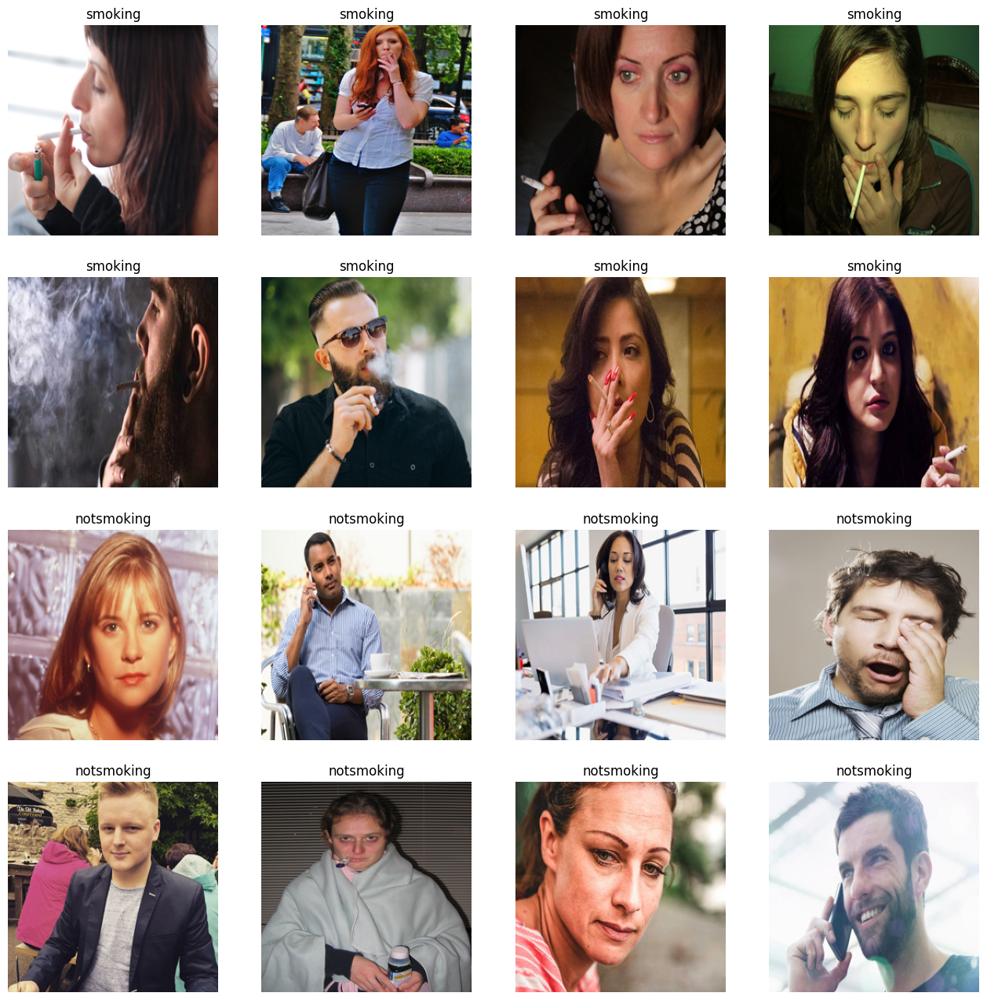

In [6]:
path = os.path.join(CONFIG['data_directory'], CONFIG['train_directory'])
show_image(path)

In [7]:
class SmokingDataset(Dataset):
    def __init__(self, root_dir, split=CONFIG['train_directory'], transform=None):
        self.root_dir = os.path.join(root_dir, split)
        self.transform = transform
        self.img_data = os.listdir(self.root_dir)
        self.images = self._load_images()

    def _load_images(self):
        images = []
        for img_path in self.img_data:
            img_class = img_path.split('_')[0]
            img_path = os.path.join(self.root_dir, img_path)
            images.append((img_path, CONFIG['class_label'][img_class]))
        return images

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path, label = self.images[idx]
        image = datasets.folder.default_loader(img_path)

        if self.transform:
            image = self.transform(image)

        return image, label

# transformation
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(128),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

valid_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# load dataset
train_dataset = SmokingDataset(root_dir=CONFIG['data_directory'], split=CONFIG['train_directory'], transform=train_transform)
test_dataset = SmokingDataset(root_dir=CONFIG['data_directory'], split=CONFIG['test_directory'], transform=test_transform)
valid_dataset = SmokingDataset(root_dir=CONFIG['data_directory'], split=CONFIG['valid_directory'], transform=valid_transform)

# create data loader
train_loader = DataLoader(train_dataset, batch_size=CONFIG['batch_size'], shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=CONFIG['batch_size'], shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=CONFIG['batch_size'], shuffle=False)

# checking dataset
for images, labels in train_loader:
    print('Image batch dimensions:', images.shape)
    print('Image label dimensions:', labels.shape)
    print('Class labels of 10 examples:', labels[:10])
    break

Image batch dimensions: torch.Size([16, 3, 128, 128])
Image label dimensions: torch.Size([16])
Class labels of 10 examples: tensor([1, 0, 0, 0, 1, 0, 0, 1, 1, 0])


## Model Training and Accuracy

In [8]:
@torch.no_grad()    # Tell PyTorch to exclude the gradient calculations
def get_inference(model, type):
    """Get the model accuracy"""
    # Get the data loader
    data_loader = {
        'train': train_loader,
        'valid': valid_loader,
        'test': test_loader
    }[type]

    correct_pred, num_samples, loss = 0, 0, 0.

    model.eval()
    for i, (imgs, targets) in enumerate(data_loader):
        imgs, targets = imgs.to(device), targets.to(device)
        targets = targets.float().view(-1, 1)
        
        # Predict
        probs = model(imgs)
        preds = (probs > 0.5).float()

        # Calculate acc & loss
        correct_pred += (preds == targets).sum()
        num_samples += targets.size(0)
        loss += targets.size(0) * F.binary_cross_entropy_with_logits(probs, targets)

    # Find the mean loss & acc
    loss = loss / num_samples
    acc = 100 * correct_pred.float()/num_samples

    return acc, loss


In [9]:
def train(model, max_epoch, train_loader, optimizer):
    """Train the model"""
    # Initialize
    train_acc_list = []
    valid_acc_list = []
    losses = []

    # Start iteration
    start_time = time.time()
    for epoch in range(max_epoch):
        # Training -- iterate over batch
        model.train()
        for batch_idx, (imgs, targets) in enumerate(train_loader):
            imgs, targets = imgs.to(device), targets.to(device)
            targets = targets.float().view(-1, 1)

            # Forward pass
            probs = model(imgs)
            loss = F.binary_cross_entropy_with_logits(probs, targets)

            # Backpropagation
            model.zero_grad(set_to_none=True)
            loss.backward()

            # Update the model parameter
            optimizer.step()

            # Log the minibatch (inner iteration)
            losses.append(loss.item())
            if not batch_idx % int(len(train_loader)/2.):
                print(f'Epoch: {epoch+1:03d}/{max_epoch:03d} '
                      f'| Batch: {batch_idx:04d}/{len(train_loader):04d} '
                      f'| Loss: {loss:.4f}')

        # Inference
        model.eval()
        with torch.no_grad():
            train_acc, _ = get_inference(model, 'train')
            valid_acc, _ = get_inference(model, 'valid')

            print(f'Epoch: {epoch+1:03d}/{max_epoch:03d} '
                  f'| Train: {train_acc:.2f}% '
                  f'| Valid: {valid_acc:.2f}%')
            print('')

            train_acc_list.append(train_acc.item())
            valid_acc_list.append(valid_acc.item())

    # Finalize
    elapsed = (time.time() - start_time)/60
    print(f'Total Training Time: {elapsed:.2f} min')

    return losses, train_acc_list, valid_acc_list

## Model

### 1. MLP

In [10]:
model_name = "MLP"

In [11]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()

        # Create the MLP
        torch.manual_seed(42)
        self.mlp = nn.Sequential(
            # Flatten
            nn.Flatten(),

            # 1 hidden layer
            nn.Linear(3 * 128 * 128, 64),
            nn.ReLU(),

            # 2 hidden layer
            nn.Linear(64, 128),
            nn.ReLU(),

            # 3 hidden layer
            nn.Linear(128, 256),
            nn.ReLU(),

            # Output layer
            nn.Linear(256, 1),
            nn.Sigmoid()
            
        ).to(device)

    def forward(self, X):
        return self.mlp(X)

In [12]:
# Initialize models
model = MLP().to(device)

# Print number of parameters
print('Total parameters :', sum(p.nelement() for p in model.parameters()))

Total parameters : 3187393


In [13]:
optimizer = torch.optim.Adam(params = model.parameters(),
                               lr = 1e-4)

In [14]:
losses, train_acc_list, valid_acc_list = train(model=model,
                                                 max_epoch=CONFIG['max_epochs'],
                                                 train_loader=train_loader,
                                                 optimizer=optimizer)

Epoch: 001/050 | Batch: 0000/0045 | Loss: 0.7850
Epoch: 001/050 | Batch: 0022/0045 | Loss: 0.5301
Epoch: 001/050 | Batch: 0044/0045 | Loss: 0.6731
Epoch: 001/050 | Train: 68.99% | Valid: 71.11%

Epoch: 002/050 | Batch: 0000/0045 | Loss: 0.6174
Epoch: 002/050 | Batch: 0022/0045 | Loss: 0.7115
Epoch: 002/050 | Batch: 0044/0045 | Loss: 0.5451
Epoch: 002/050 | Train: 67.18% | Valid: 71.67%

Epoch: 003/050 | Batch: 0000/0045 | Loss: 0.6666
Epoch: 003/050 | Batch: 0022/0045 | Loss: 0.6443
Epoch: 003/050 | Batch: 0044/0045 | Loss: 0.7183
Epoch: 003/050 | Train: 68.85% | Valid: 70.00%

Epoch: 004/050 | Batch: 0000/0045 | Loss: 0.5969
Epoch: 004/050 | Batch: 0022/0045 | Loss: 0.5970
Epoch: 004/050 | Batch: 0044/0045 | Loss: 0.6412
Epoch: 004/050 | Train: 65.36% | Valid: 66.67%

Epoch: 005/050 | Batch: 0000/0045 | Loss: 0.7417
Epoch: 005/050 | Batch: 0022/0045 | Loss: 0.6365
Epoch: 005/050 | Batch: 0044/0045 | Loss: 0.7039
Epoch: 005/050 | Train: 69.83% | Valid: 70.56%

Epoch: 006/050 | Batch: 0

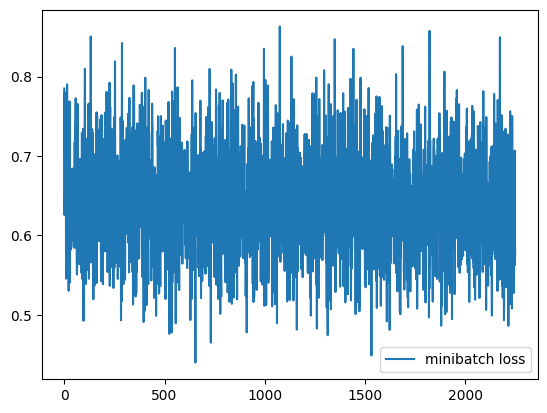

In [15]:
plt.plot(np.arange(len(losses)), losses, c='tab:blue', label='minibatch loss')
plt.legend()
plt.show()

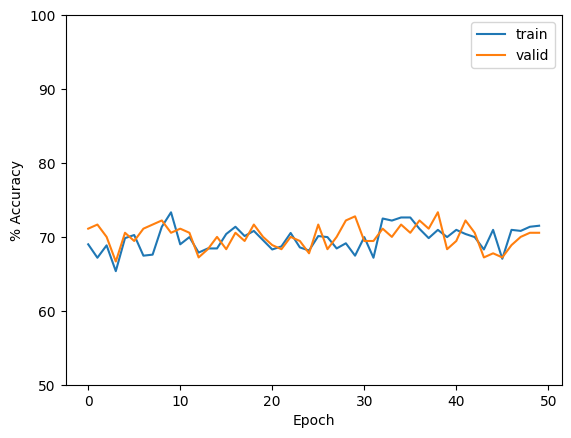

In [16]:
plt.plot(np.arange(len(train_acc_list)), train_acc_list, c='tab:blue', label='train')
plt.plot(np.arange(len(valid_acc_list)), valid_acc_list, c='tab:orange', label='valid')
plt.ylabel('% Accuracy'); plt.xlabel('Epoch')
plt.ylim(50, 100)
plt.legend()
plt.show()

In [17]:
train_acc, train_loss = get_inference(model, 'train')
valid_acc, valid_loss = get_inference(model, 'valid')

summary_df = pd.DataFrame(
    np.array([[train_acc.cpu(), valid_acc.cpu(), train_loss.cpu(), valid_loss.cpu()]]),
    index = [model_name],
    columns = ['Train Acc', 'Valid Acc', 'Train Loss', 'Valid Loss']
)

summary_df

,Train Acc,Valid Acc,Train Loss,Valid Loss
MLP,70.111732,70.555557,0.641073,0.641869


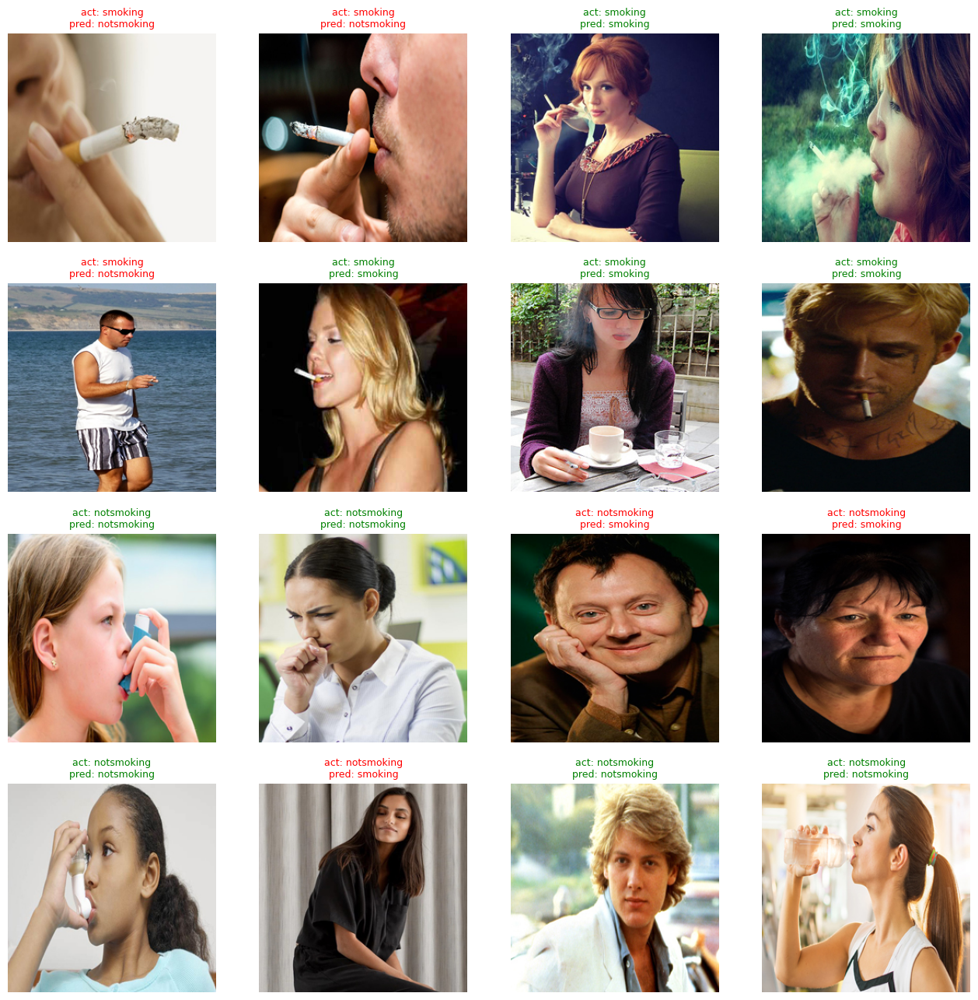

In [21]:
path = os.path.join(CONFIG['data_directory'], CONFIG['test_directory'])
show_image(path, predict=True)

### 2. CNN

In [22]:
model_name = "CNN"

In [23]:
class CNN(nn.Module):
    def __init__(self, config):
        super().__init__()

        # Create the CNN
        torch.cuda.manual_seed(42)
        self.cnn = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Flatten(),
            nn.Linear(128 * 32 * 32, 256),
            nn.ReLU(),
            nn.Linear(256, 1),  # Output size 1 for binary classification
            nn.Sigmoid()

        ).to(device)

    def forward(self, X):
        logits = self.cnn(X)
        return logits

In [24]:
# Initialize models
model_cnn = CNN(CONFIG).to(device)

# Print number of parameters
print('Total parameters :', sum(p.nelement() for p in model.parameters()))

Total parameters : 3187393


In [25]:
optimizer = torch.optim.Adam(params = model.parameters(),
                               lr = 1e-4)

In [26]:
losses, train_acc_list, valid_acc_list = train(model=model,
                                                 max_epoch=CONFIG['max_epochs'],
                                                 train_loader=train_loader,
                                                 optimizer=optimizer)

Epoch: 001/050 | Batch: 0000/0045 | Loss: 0.6057
Epoch: 001/050 | Batch: 0022/0045 | Loss: 0.5744
Epoch: 001/050 | Batch: 0044/0045 | Loss: 0.6520
Epoch: 001/050 | Train: 69.27% | Valid: 69.44%

Epoch: 002/050 | Batch: 0000/0045 | Loss: 0.7046
Epoch: 002/050 | Batch: 0022/0045 | Loss: 0.6342
Epoch: 002/050 | Batch: 0044/0045 | Loss: 0.6686
Epoch: 002/050 | Train: 72.35% | Valid: 69.44%

Epoch: 003/050 | Batch: 0000/0045 | Loss: 0.6380
Epoch: 003/050 | Batch: 0022/0045 | Loss: 0.5788
Epoch: 003/050 | Batch: 0044/0045 | Loss: 0.7022
Epoch: 003/050 | Train: 68.44% | Valid: 69.44%

Epoch: 004/050 | Batch: 0000/0045 | Loss: 0.6257
Epoch: 004/050 | Batch: 0022/0045 | Loss: 0.6448
Epoch: 004/050 | Batch: 0044/0045 | Loss: 0.6015
Epoch: 004/050 | Train: 69.41% | Valid: 72.22%

Epoch: 005/050 | Batch: 0000/0045 | Loss: 0.5838
Epoch: 005/050 | Batch: 0022/0045 | Loss: 0.6962
Epoch: 005/050 | Batch: 0044/0045 | Loss: 0.7013
Epoch: 005/050 | Train: 65.78% | Valid: 70.56%

Epoch: 006/050 | Batch: 0

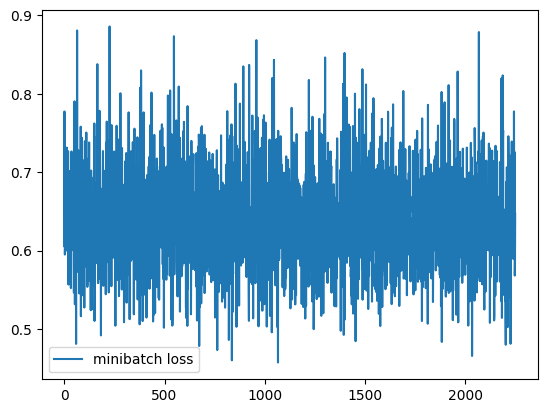

In [27]:
plt.plot(np.arange(len(losses)), losses, c='tab:blue', label='minibatch loss')
plt.legend()
plt.show()

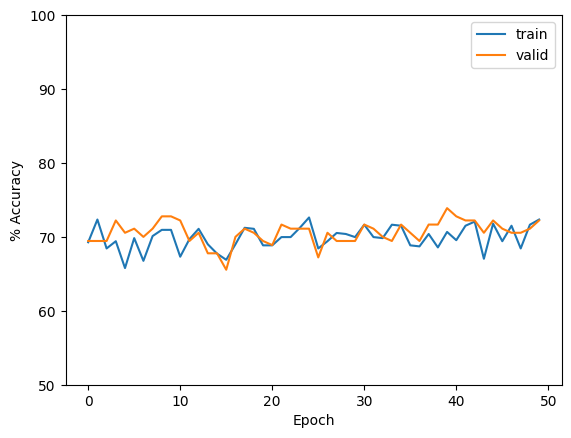

In [28]:
plt.plot(np.arange(len(train_acc_list)), train_acc_list, c='tab:blue', label='train')
plt.plot(np.arange(len(valid_acc_list)), valid_acc_list, c='tab:orange', label='valid')
plt.ylabel('% Accuracy'); plt.xlabel('Epoch')
plt.ylim(50, 100)
plt.legend()
plt.show()

In [29]:
train_acc, train_loss = get_inference(model, 'train')
valid_acc, valid_loss = get_inference(model, 'valid')

summary_df.loc[model_name] = np.array([train_acc.cpu(), valid_acc.cpu(), train_loss.cpu(), valid_loss.cpu()])
summary_df
summary_df

,Train Acc,Valid Acc,Train Loss,Valid Loss
MLP,70.111732,70.555557,0.641073,0.641869
CNN,69.134079,72.222221,0.640466,0.635709


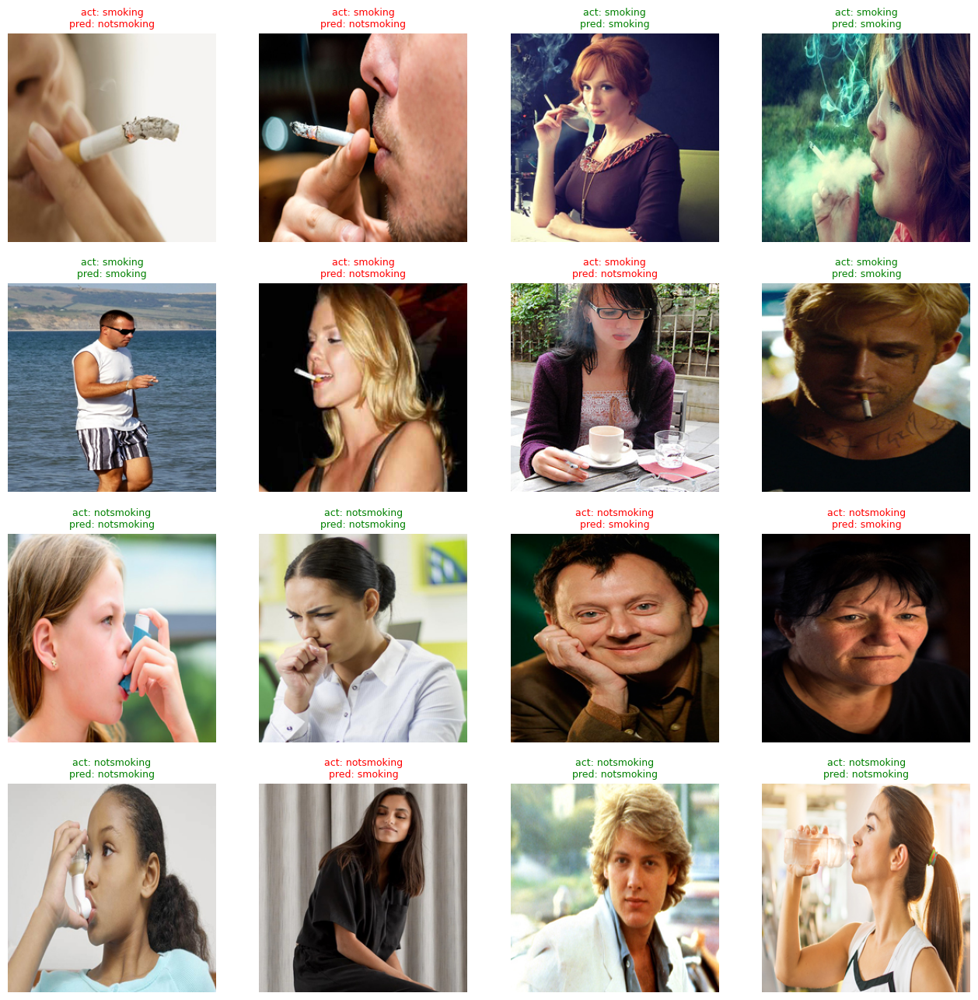

In [30]:
path = os.path.join(CONFIG['data_directory'], CONFIG['test_directory'])
show_image(path, predict=True)

### 3. Deeep CNN

In [31]:
model_name = "Deep CNN"

In [32]:
class DeepCNN(nn.Module):
    def __init__(self, config):
        super().__init__()

        # Create the CNN
        torch.cuda.manual_seed(42)
        self.cnn = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.flatten = nn.Flatten()
        
        self.fc = nn.Sequential(
            nn.Linear(512 * 8 * 8, 512),
            nn.ReLU(),

            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.5),

            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.cnn(x)
        x = self.flatten(x)

        x = self.fc(x)
        return x

In [33]:
# Initialize models
model = DeepCNN(CONFIG).to(device)

# Print number of parameters
print('Total parameters :', sum(p.nelement() for p in model.parameters()))

Total parameters : 18460289


In [34]:
optimizer = torch.optim.Adam(params = model.parameters(),
                               lr = 1e-4)

In [35]:
losses, train_acc_list, valid_acc_list = train(model=model,
                                                 max_epoch=CONFIG['max_epochs'],
                                                 train_loader=train_loader,
                                                 optimizer=optimizer)

Epoch: 001/050 | Batch: 0000/0045 | Loss: 0.6927
Epoch: 001/050 | Batch: 0022/0045 | Loss: 0.6725
Epoch: 001/050 | Batch: 0044/0045 | Loss: 0.6434
Epoch: 001/050 | Train: 68.58% | Valid: 67.78%

Epoch: 002/050 | Batch: 0000/0045 | Loss: 0.6408
Epoch: 002/050 | Batch: 0022/0045 | Loss: 0.5883
Epoch: 002/050 | Batch: 0044/0045 | Loss: 0.5484
Epoch: 002/050 | Train: 70.95% | Valid: 70.56%

Epoch: 003/050 | Batch: 0000/0045 | Loss: 0.7250
Epoch: 003/050 | Batch: 0022/0045 | Loss: 0.5721
Epoch: 003/050 | Batch: 0044/0045 | Loss: 0.7354
Epoch: 003/050 | Train: 65.08% | Valid: 62.78%

Epoch: 004/050 | Batch: 0000/0045 | Loss: 0.7159
Epoch: 004/050 | Batch: 0022/0045 | Loss: 0.6476
Epoch: 004/050 | Batch: 0044/0045 | Loss: 0.6035
Epoch: 004/050 | Train: 64.53% | Valid: 57.78%

Epoch: 005/050 | Batch: 0000/0045 | Loss: 0.7008
Epoch: 005/050 | Batch: 0022/0045 | Loss: 0.6393
Epoch: 005/050 | Batch: 0044/0045 | Loss: 0.6300
Epoch: 005/050 | Train: 59.64% | Valid: 57.22%

Epoch: 006/050 | Batch: 0

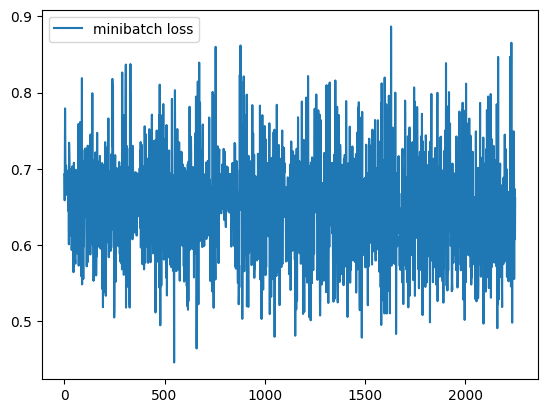

In [36]:
plt.plot(np.arange(len(losses)), losses, c='tab:blue', label='minibatch loss')
plt.legend()
plt.show()

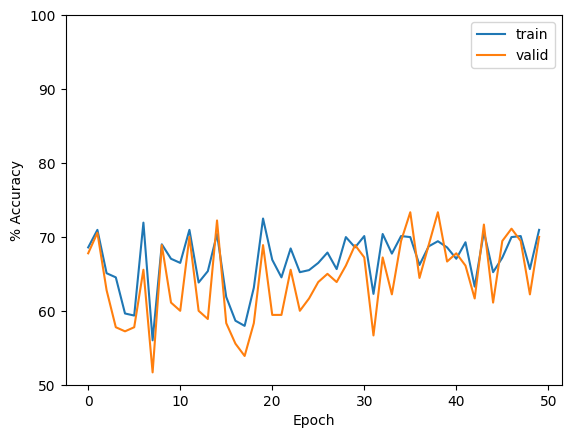

In [37]:
plt.plot(np.arange(len(train_acc_list)), train_acc_list, c='tab:blue', label='train')
plt.plot(np.arange(len(valid_acc_list)), valid_acc_list, c='tab:orange', label='valid')
plt.ylabel('% Accuracy'); plt.xlabel('Epoch')
plt.ylim(50, 100)
plt.legend()
plt.show()

In [38]:
train_acc, train_loss = get_inference(model, 'train')
valid_acc, valid_loss = get_inference(model, 'valid')

summary_df.loc[model_name] = np.array([train_acc.cpu(), valid_acc.cpu(), train_loss.cpu(), valid_loss.cpu()])
summary_df
summary_df

,Train Acc,Valid Acc,Train Loss,Valid Loss
MLP,70.111732,70.555557,0.641073,0.641869
CNN,69.134079,72.222221,0.640466,0.635709
Deep CNN,72.206703,70.000000,0.630609,0.642811


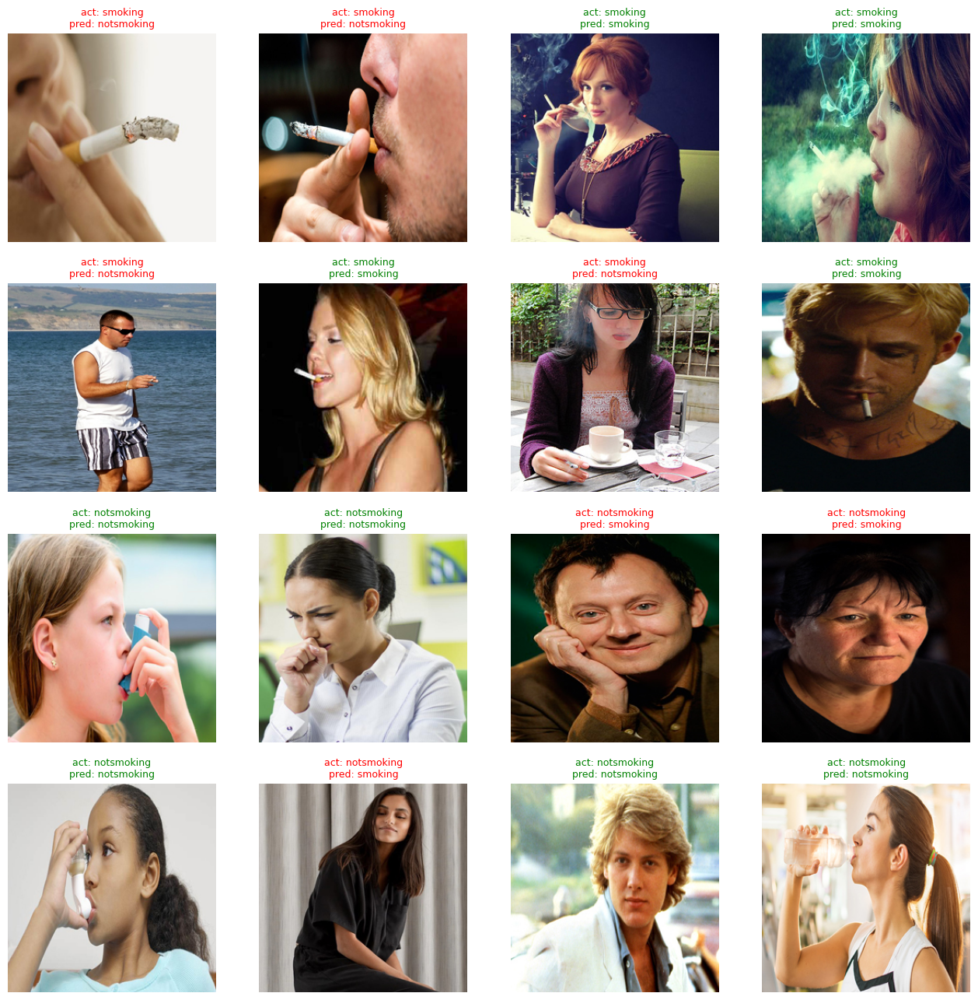

In [39]:
path = os.path.join(CONFIG['data_directory'], CONFIG['test_directory'])
show_image(path, predict=True)

### 4. Transfer Learning (ResNet)

In [40]:
model_name = "ResNet"

In [41]:
# Load a pre-trained ResNet18 model
model= models.resnet50(pretrained=True).to(device)
num_features = model.fc.in_features

# Modify the last layer for binary classification with sigmoid activation
model.fc = nn.Sequential(
    nn.Linear(num_features, 1),
    nn.Sigmoid()
).to(device)

/home/adhitizki/playground/pacmann/pacmann_dl/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/adhitizki/playground/pacmann/pacmann_dl/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [42]:
optimizer = torch.optim.Adam(params = model.parameters(),
                               lr = 1e-4)

In [43]:
losses, train_acc_list, valid_acc_list = train(model=model,
                                                 max_epoch=CONFIG['max_epochs'],
                                                 train_loader=train_loader,
                                                 optimizer=optimizer)

Epoch: 001/050 | Batch: 0000/0045 | Loss: 0.7702
Epoch: 001/050 | Batch: 0022/0045 | Loss: 0.6286
Epoch: 001/050 | Batch: 0044/0045 | Loss: 0.5941
Epoch: 001/050 | Train: 76.68% | Valid: 75.00%

Epoch: 002/050 | Batch: 0000/0045 | Loss: 0.5606
Epoch: 002/050 | Batch: 0022/0045 | Loss: 0.5508
Epoch: 002/050 | Batch: 0044/0045 | Loss: 0.6585
Epoch: 002/050 | Train: 76.96% | Valid: 87.22%

Epoch: 003/050 | Batch: 0000/0045 | Loss: 0.5398
Epoch: 003/050 | Batch: 0022/0045 | Loss: 0.6662
Epoch: 003/050 | Batch: 0044/0045 | Loss: 0.8166
Epoch: 003/050 | Train: 81.28% | Valid: 82.78%

Epoch: 004/050 | Batch: 0000/0045 | Loss: 0.5770
Epoch: 004/050 | Batch: 0022/0045 | Loss: 0.5618
Epoch: 004/050 | Batch: 0044/0045 | Loss: 0.5469
Epoch: 004/050 | Train: 79.89% | Valid: 85.56%

Epoch: 005/050 | Batch: 0000/0045 | Loss: 0.6410
Epoch: 005/050 | Batch: 0022/0045 | Loss: 0.5539
Epoch: 005/050 | Batch: 0044/0045 | Loss: 0.5979
Epoch: 005/050 | Train: 79.05% | Valid: 80.56%

Epoch: 006/050 | Batch: 0

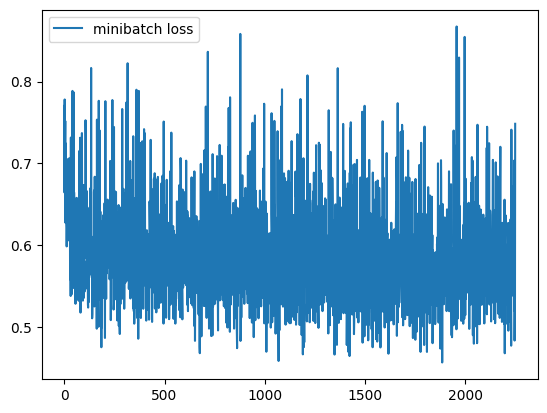

In [44]:
plt.plot(np.arange(len(losses)), losses, c='tab:blue', label='minibatch loss')
plt.legend()
plt.show()

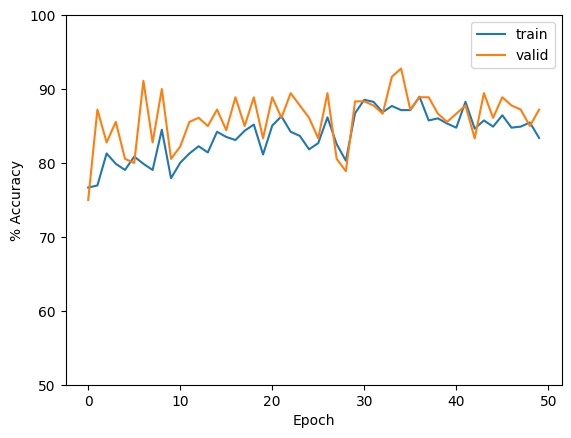

In [45]:
plt.plot(np.arange(len(train_acc_list)), train_acc_list, c='tab:blue', label='train')
plt.plot(np.arange(len(valid_acc_list)), valid_acc_list, c='tab:orange', label='valid')
plt.ylabel('% Accuracy'); plt.xlabel('Epoch')
plt.ylim(50, 100)
plt.legend()
plt.show()

In [46]:
train_acc, train_loss = get_inference(model, 'train')
valid_acc, valid_loss = get_inference(model, 'valid')

summary_df.loc[model_name] = np.array([train_acc.cpu(), valid_acc.cpu(), train_loss.cpu(), valid_loss.cpu()])
summary_df
summary_df

,Train Acc,Valid Acc,Train Loss,Valid Loss
MLP,70.111732,70.555557,0.641073,0.641869
CNN,69.134079,72.222221,0.640466,0.635709
Deep CNN,72.206703,70.000000,0.630609,0.642811
ResNet,84.217873,87.222221,0.579049,0.564783


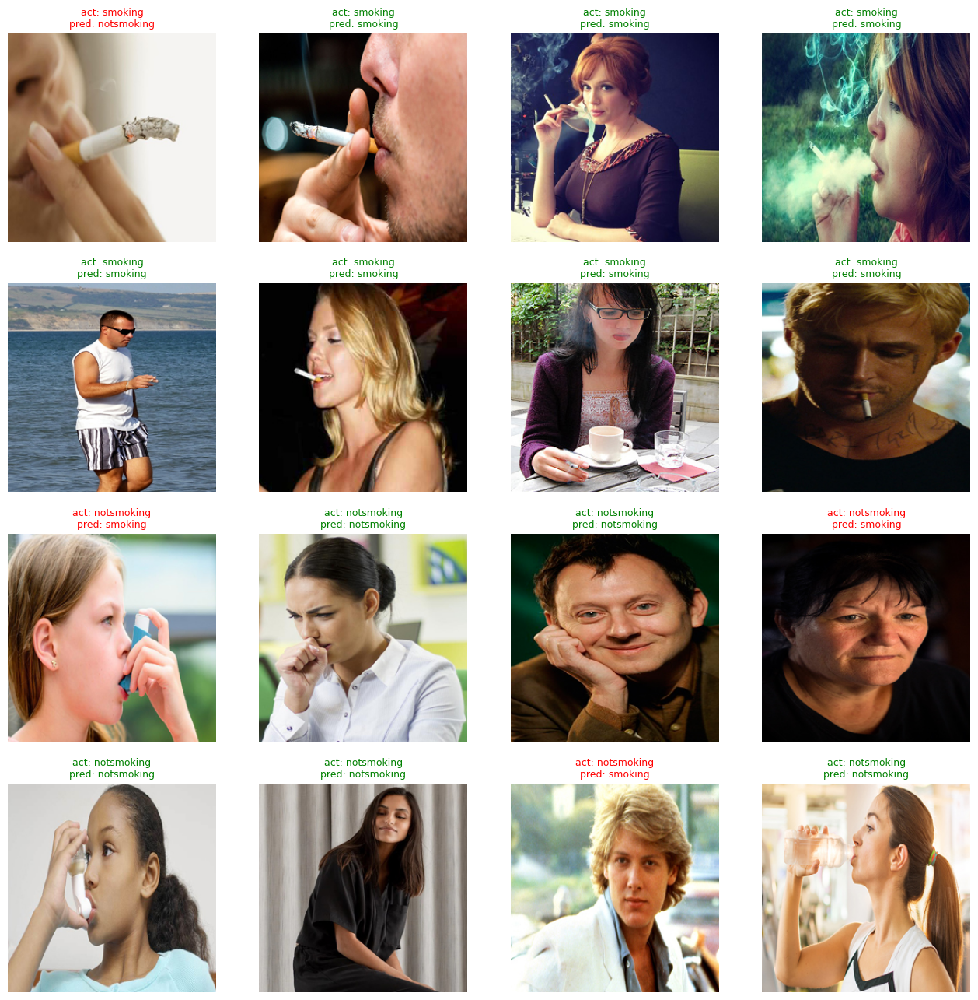

In [47]:
path = os.path.join(CONFIG['data_directory'], CONFIG['test_directory'])
show_image(path, predict=True)